In [186]:
import sys
def sizeof_fmt(num, suffix='B'):
    ''' by Fred Cirera,  https://stackoverflow.com/a/1094933/1870254, modified'''
    for unit in ['','Ki','Mi','Gi','Ti','Pi','Ei','Zi']:
        if abs(num) < 1024.0:
            return "%3.1f %s%s" % (num, unit, suffix)
        num /= 1024.0
    return "%.1f %s%s" % (num, 'Yi', suffix)

for name, size in sorted(((name, sys.getsizeof(value)) for name, value in locals().items()),
                         key= lambda x: -x[1])[:10]:
    print("{:>30}: {:>8}".format(name, sizeof_fmt(size)))

                          _142: 36.0 MiB
                          _152: 34.1 MiB
                           ___: 32.0 MiB
                          blur: 32.0 MiB
                          img2: 32.0 MiB
                   img_erosion: 32.0 MiB
                  img_dilation: 32.0 MiB
                           _74: 32.0 MiB
                           bkg: 32.0 MiB
                       bkg_sub: 32.0 MiB


In [1]:
from fish_helpers import *
from segmentation_3D import *
import cv2
md = Metadata('/hybedata/Images/Robert/TBI_v2/sham_m3_slide4_2019Nov04/')

In [2]:
def adjust(img):
    temp = img.copy()
    tmin = np.percentile(temp.ravel(),1)
    temp[temp<tmin]=tmin
    tmax = np.percentile(temp.ravel(),99)
    temp[temp>tmax]=tmax
    return temp
def show(img1,img2):
    plt.figure(figsize=[10,10])
    plt.subplot(1,2,1)
    plt.imshow(adjust(img1),cmap='inferno')
    plt.subplot(1,2,2)
    plt.imshow(adjust(img2),cmap='inferno')
    plt.show()

In [3]:
stk = md.stkread(Position='Pos1',Channel='DeepBlue',acq= [i for i in md.acqnames if 'nucstain' in i])
img = np.sum(stk,axis=2)

opening img_Pos1_000000032_000000000_DeepBlue_000_032.tif

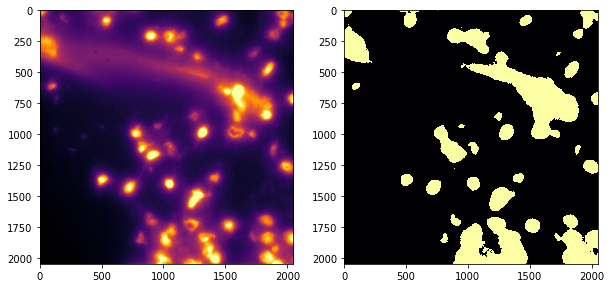

In [65]:
ret2,th2 = cv2.threshold(temp,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
show(img,th2)

In [66]:
ret2

30.0

opening img_Pos1_000000032_000000000_DeepBlue_000_032.tif

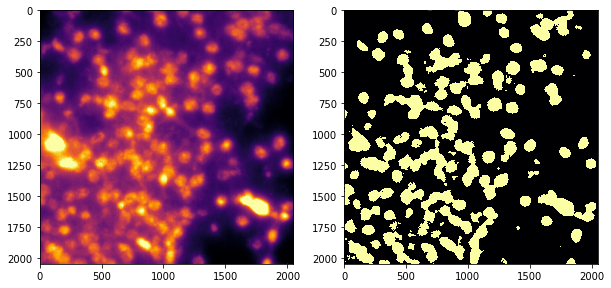

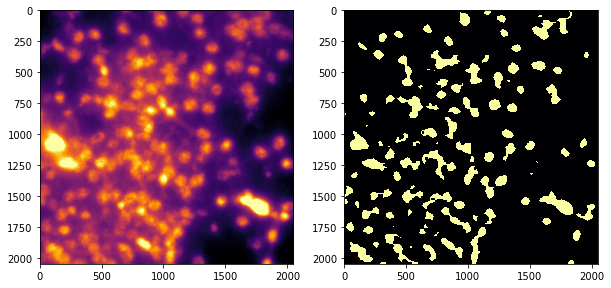

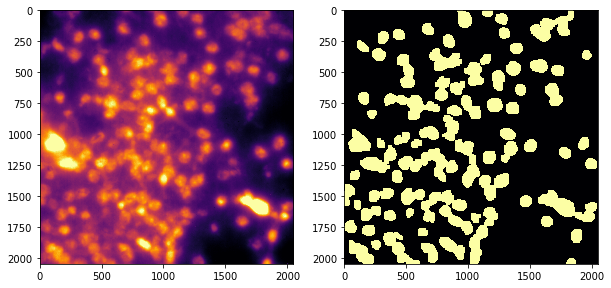

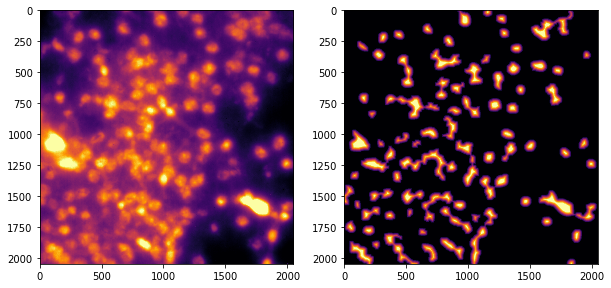

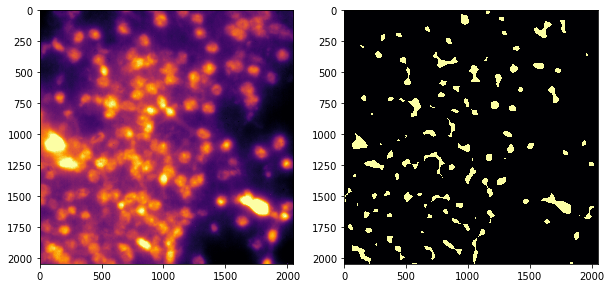

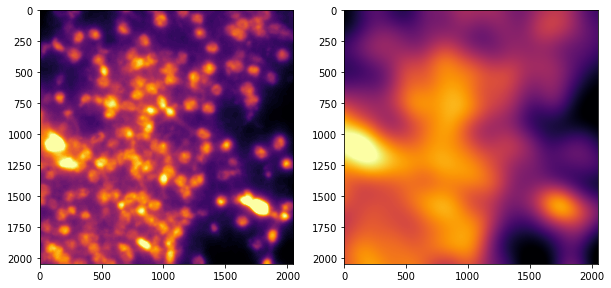

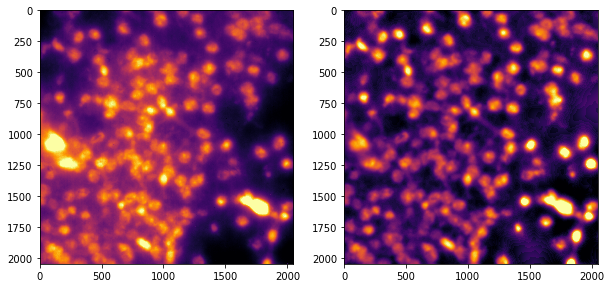

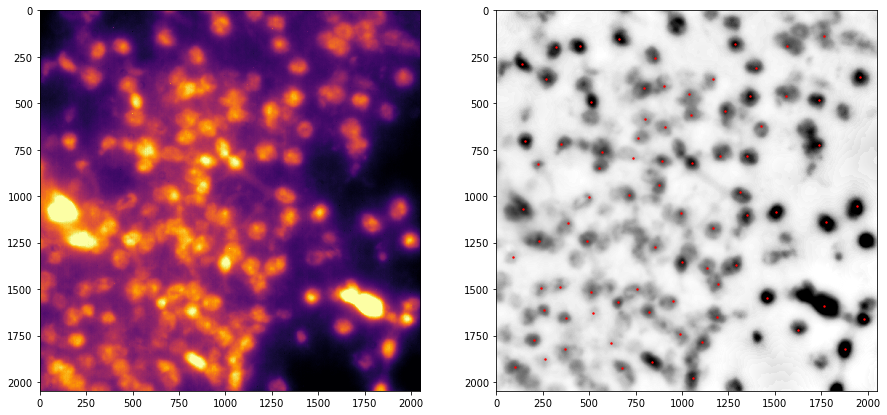

In [123]:
def remove_odd_objects(img,min_size = 10**3,max_size=10**4):
    nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(img_erosion, connectivity=8)
    sizes = stats[1:, -1]; nb_components = nb_components - 1
    img2 = np.zeros((output.shape))
    for i in range(0, nb_components):
        if sizes[i] >= min_size:
            if sizes[i] <= max_size:
                img2[output == i + 1] = 255
    return img2
pos = 'Pos1'
stk = md.stkread(Position=pos,Channel='DeepBlue',acq= [i for i in md.acqnames if 'nucstain' in i])
img = np.sum(stk,axis=2)
temp = 255*img.copy()/np.max(img)
temp = temp.astype('uint8')
mask = cv2.adaptiveThreshold(temp,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,301,0)
ret2,th2 = cv2.threshold(temp,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
mask[th2==0]=0
show(img,mask)
kernel = np.ones((10,10), np.uint8)
img_erosion = cv2.erode(mask, kernel, iterations=2)
show(img,img_erosion)
img2 = remove_odd_objects(img_erosion,min_size = 10**3,max_size=10**5)
kernel = np.ones((10,10), np.uint8)
img_dilation = cv2.dilate(img2, kernel, iterations=3) 
show(img,img_dilation)
dist_transform = cv2.distanceTransform(img_dilation.astype('uint8'),cv2.DIST_L2,5)
show(img,dist_transform)
ret, sure_fg = cv2.threshold(dist_transform,0.4*dist_transform.max(),255,0)
show(img,sure_fg)
blur = cv2.GaussianBlur(temp,(31,31),0)
bkg = filters.gaussian(temp,101)
bkg_sub = blur/bkg
show(blur,bkg)
show(img,bkg_sub)
val = np.sqrt(2*((5/0.109)**2))
local_maxi = peak_local_max(bkg_sub, indices=True, min_distance=int(val),labels=img_dilation)
plt.figure(figsize=[15,15])
plt.title(pos)
plt.subplot(1,2,1)
plt.imshow(adjust(img),cmap='inferno')
plt.subplot(1,2,2)
plt.imshow(adjust(bkg_sub),cmap='Greys')
plt.scatter(local_maxi[:,1],local_maxi[:,0],s=2,c='r')
# plt.subplot(1,3,3)
# plt.imshow(img_dilation,cmap='inferno')
plt.show()

opening img_Pos1_000000032_000000000_DeepBlue_000_032.tif

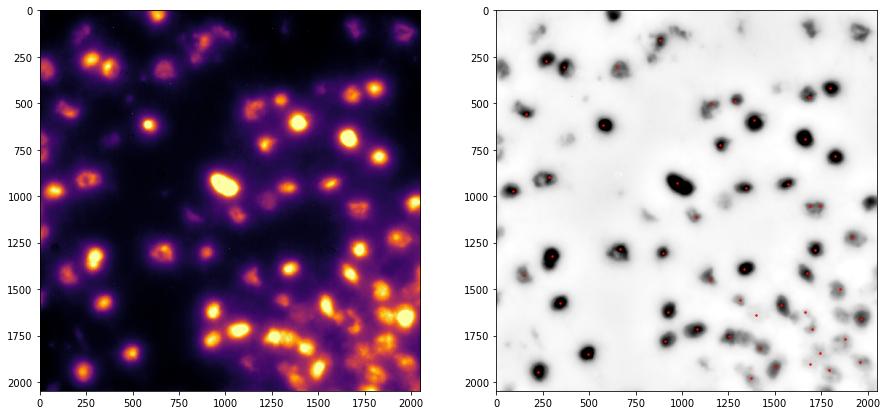

In [173]:
def remove_odd_objects(img_erosion,min_size = 10**3,max_size=10**4):
    nb_components, output, stats, centroids = cv2.connectedComponentsWithStats(img_erosion, connectivity=8)
    sizes = stats[1:, -1]; nb_components = nb_components - 1
    img2 = np.zeros((output.shape))
    for i in range(0, nb_components):
        if sizes[i] >= min_size:
            if sizes[i] <= max_size:
                img2[output == i + 1] = 255
    return img2
pos = 'Pos9'
def find_cell_centers(pos,md):
    stk = md.stkread(Position=pos,Channel='DeepBlue',acq= [i for i in md.acqnames if 'nucstain' in i])
    img = np.sum(stk,axis=2).astype('float64')
    temp = 255*img.copy()/np.max(img)
    temp = temp.astype('uint8')
    mask = cv2.adaptiveThreshold(temp,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,301,0)
    ret2,th2 = cv2.threshold(temp,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    mask[th2==0]=0
    kernel = np.ones((10,10), np.uint8)
    img_erosion = cv2.erode(mask, kernel, iterations=2)
    img_erosion = remove_odd_objects(img_erosion,min_size = 10**3,max_size=10**5)
    kernel = np.ones((10,10), np.uint8)
    img_dilation = cv2.dilate(img_erosion, kernel, iterations=3) 
    blur = filters.gaussian(img,2)
    bkg = filters.gaussian(img,101)
    bkg_sub = blur/bkg
    val = np.sqrt(2*((3/0.109)**2))
    local_maxi = peak_local_max(bkg_sub, indices=True, min_distance=int(val),labels=img_dilation)
    cell_df = pd.DataFrame(index = ['cell'+str(i)+'_'+pos for i in range(local_maxi.shape[0])])
    cell_df['x'] = local_maxi[:,0]
    cell_df['y'] = local_maxi[:,1]
    return cell_df
cell_df = find_cell_centers('Pos1',md)
plt.figure(figsize=[15,15])
plt.title(pos)
plt.subplot(1,2,1)
plt.imshow(adjust(img),cmap='inferno')
plt.subplot(1,2,2)
plt.imshow(adjust(bkg_sub),cmap='Greys')
plt.scatter(local_maxi[:,1],local_maxi[:,0],s=2,c='r')
plt.show()

opening img_Pos186_000000015_000000000_DeepBlue_000_015.tif

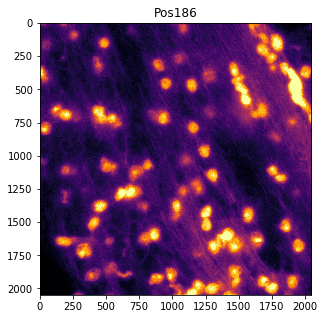

opening img_Pos191_000000015_000000000_DeepBlue_000_015.tif

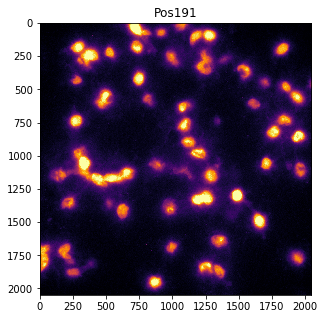

opening img_Pos90_000000015_000000000_DeepBlue_000_015.tif

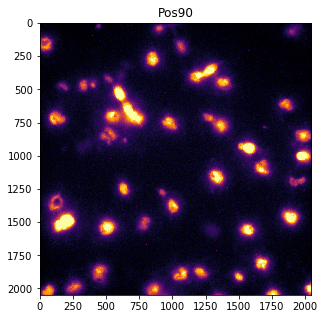

opening img_Pos107_000000015_000000000_DeepBlue_000_015.tif

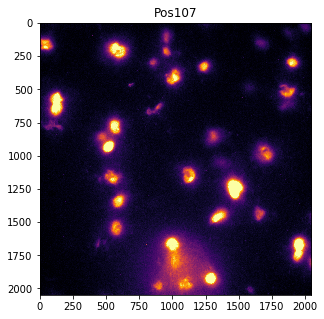

opening img_Pos103_000000015_000000000_DeepBlue_000_015.tif

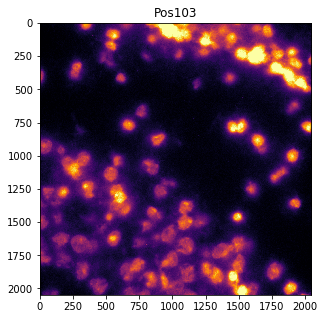

opening img_Pos178_000000015_000000000_DeepBlue_000_015.tif

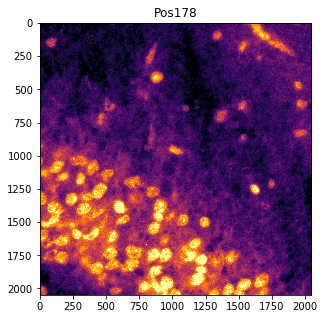

opening img_Pos229_000000015_000000000_DeepBlue_000_015.tif

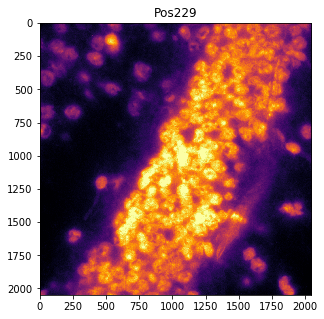

opening img_Pos286_000000015_000000000_DeepBlue_000_015.tif

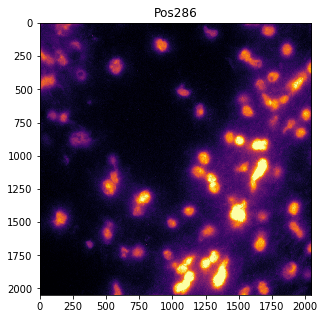

opening img_Pos53_000000015_000000000_DeepBlue_000_015.tif

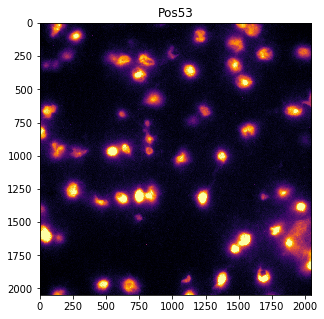

opening img_Pos173_000000015_000000000_DeepBlue_000_015.tif

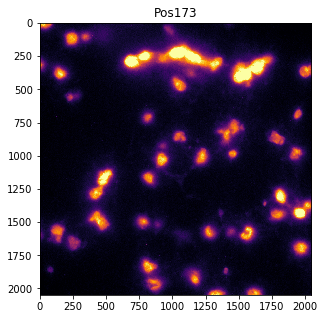

opening img_Pos63_000000015_000000000_DeepBlue_000_015.tif

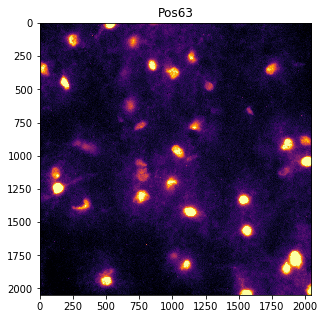

opening img_Pos227_000000015_000000000_DeepBlue_000_015.tif

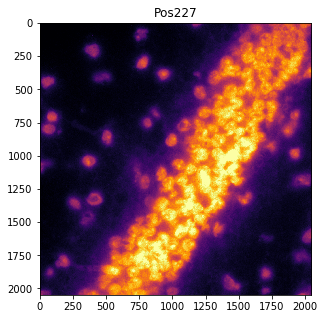

opening img_Pos73_000000015_000000000_DeepBlue_000_015.tif

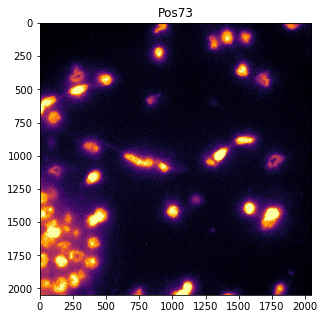

opening img_Pos246_000000015_000000000_DeepBlue_000_015.tif

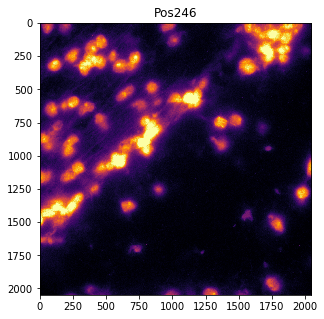

opening img_Pos207_000000015_000000000_DeepBlue_000_015.tif

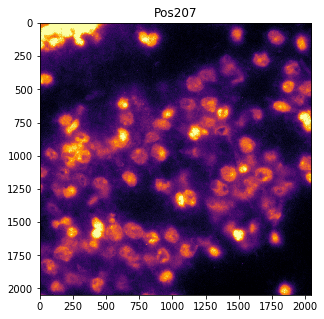

opening img_Pos221_000000015_000000000_DeepBlue_000_015.tif

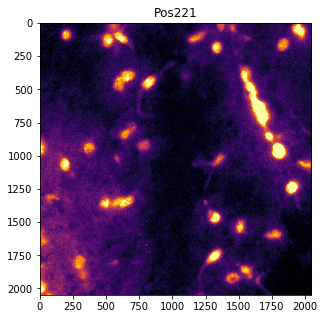

opening img_Pos113_000000015_000000000_DeepBlue_000_015.tif

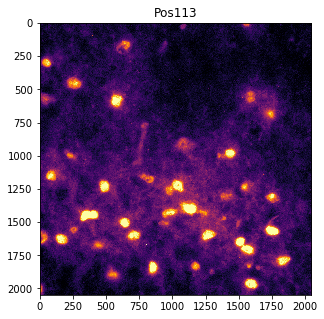

opening img_Pos226_000000015_000000000_DeepBlue_000_015.tif

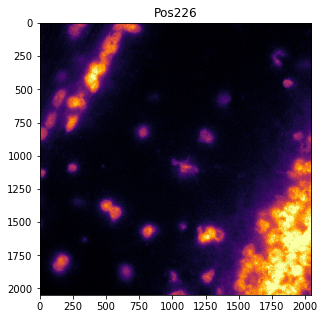

opening img_Pos64_000000015_000000000_DeepBlue_000_015.tif

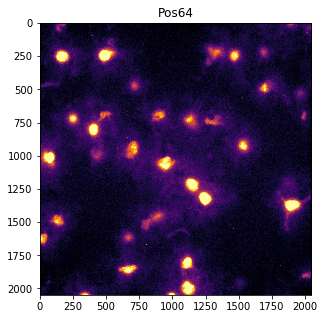

opening img_Pos196_000000015_000000000_DeepBlue_000_015.tif

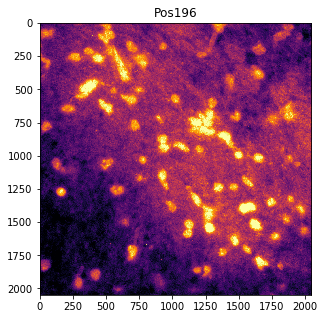

opening img_Pos161_000000015_000000000_DeepBlue_000_015.tif

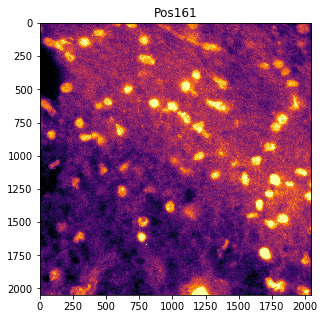

opening img_Pos259_000000015_000000000_DeepBlue_000_015.tif

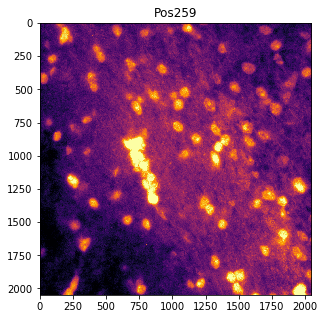

opening img_Pos225_000000015_000000000_DeepBlue_000_015.tif

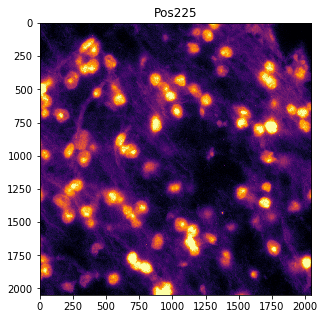

opening img_Pos220_000000015_000000000_DeepBlue_000_015.tif

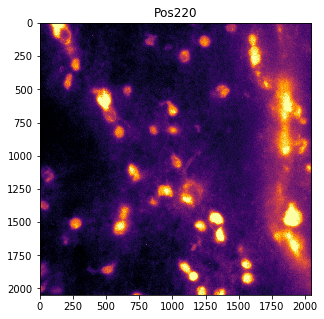

opening img_Pos84_000000015_000000000_DeepBlue_000_015.tif

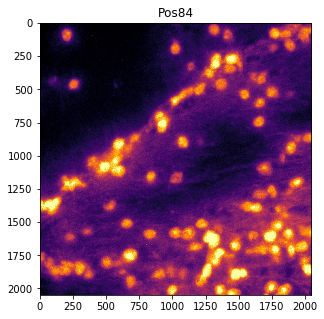

opening img_Pos56_000000015_000000000_DeepBlue_000_015.tif

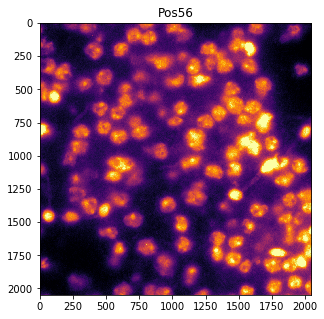

opening img_Pos144_000000015_000000000_DeepBlue_000_015.tif

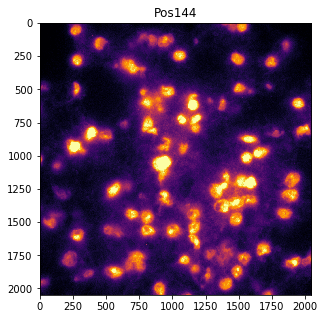

opening img_Pos20_000000015_000000000_DeepBlue_000_015.tif

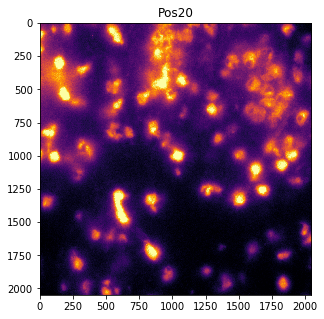

opening img_Pos54_000000015_000000000_DeepBlue_000_015.tif

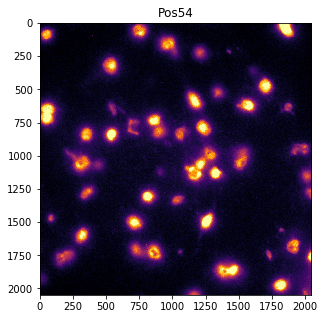

opening img_Pos299_000000015_000000000_DeepBlue_000_015.tif

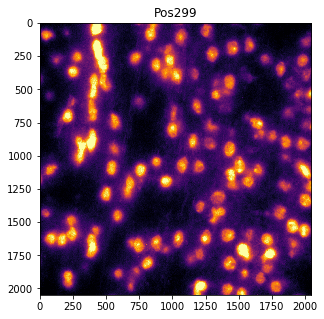

opening img_Pos33_000000015_000000000_DeepBlue_000_015.tif

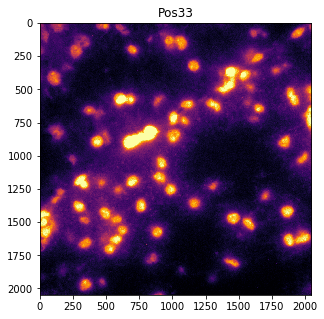

opening img_Pos140_000000015_000000000_DeepBlue_000_015.tif

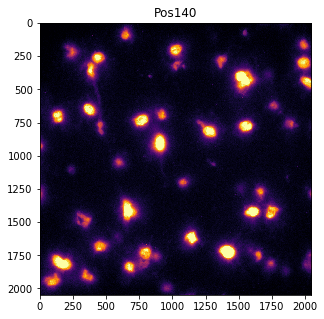

opening img_Pos190_000000015_000000000_DeepBlue_000_015.tif

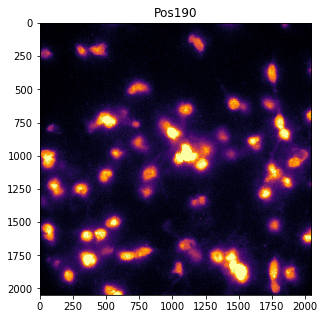

opening img_Pos175_000000015_000000000_DeepBlue_000_015.tif

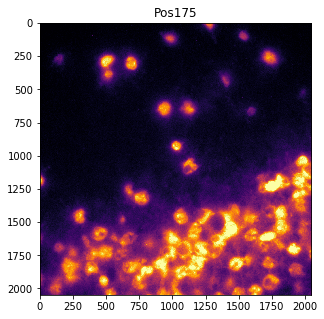

opening img_Pos264_000000015_000000000_DeepBlue_000_015.tif

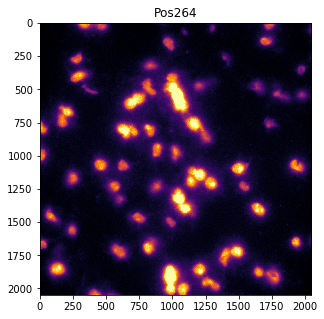

opening img_Pos282_000000015_000000000_DeepBlue_000_015.tif

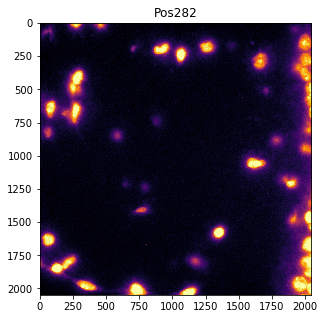

opening img_Pos258_000000015_000000000_DeepBlue_000_015.tif

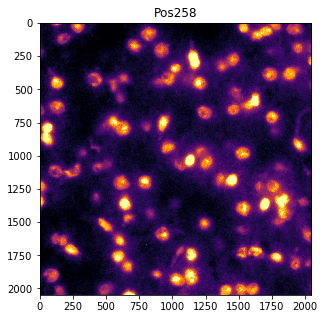

opening img_Pos59_000000015_000000000_DeepBlue_000_015.tif

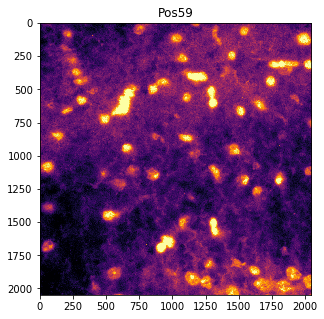

opening img_Pos8_000000015_000000000_DeepBlue_000_015.tif

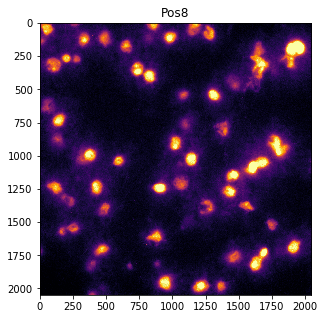

opening img_Pos91_000000015_000000000_DeepBlue_000_015.tif

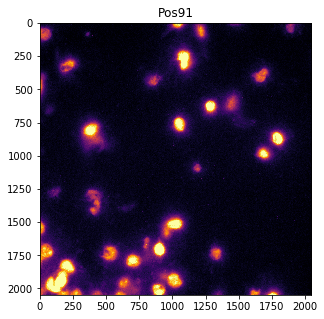

opening img_Pos253_000000015_000000000_DeepBlue_000_015.tif

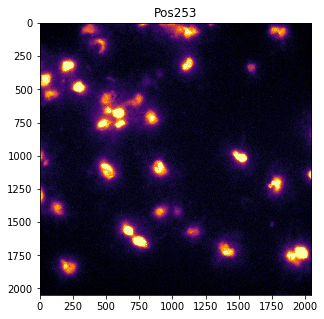

opening img_Pos108_000000015_000000000_DeepBlue_000_015.tif

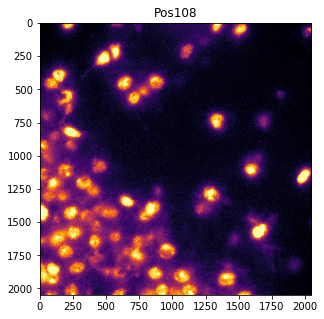

opening img_Pos124_000000015_000000000_DeepBlue_000_015.tif

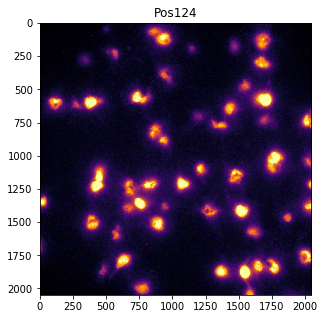

opening img_Pos172_000000015_000000000_DeepBlue_000_015.tif

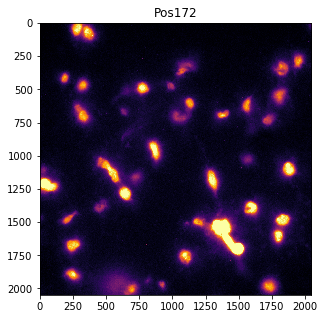

opening img_Pos42_000000015_000000000_DeepBlue_000_015.tif

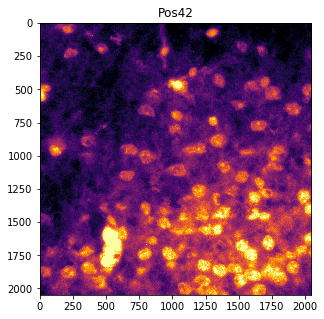

opening img_Pos69_000000015_000000000_DeepBlue_000_015.tif

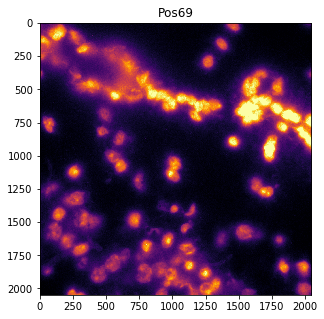

opening img_Pos252_000000015_000000000_DeepBlue_000_015.tif

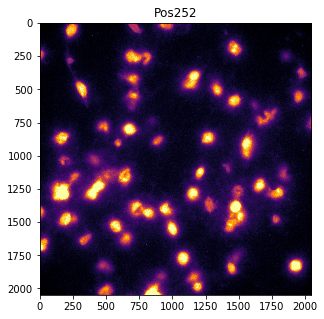

opening img_Pos123_000000015_000000000_DeepBlue_000_015.tif

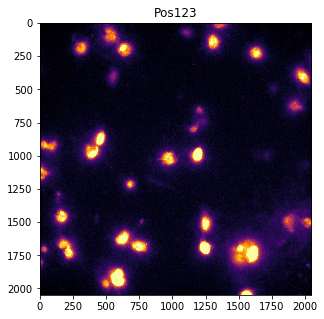

opening img_Pos115_000000015_000000000_DeepBlue_000_015.tif

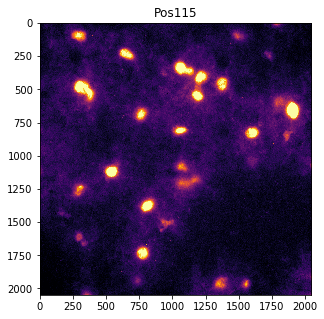

opening img_Pos195_000000015_000000000_DeepBlue_000_015.tif

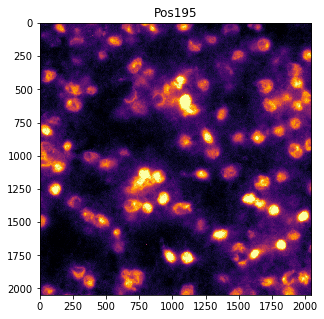

In [185]:
import random
for pos in random.sample([i for i in md.posnames if 'Pos' in i],50):
    img = md.stkread(Position=pos,Channel='DeepBlue',acq= [i for i in md.acqnames if 'nucstain' in i],Zindex=15)[:,:,0]
    plt.figure(figsize=[5,5])
    plt.imshow(adjust(img),cmap='inferno')
    plt.title(pos)
    plt.show()

In [176]:
import tqdm.notebook as tqdm
from multiprocessing import Pool
import sys
from functools import partial
sys.stdout.flush()
pfunc = partial(find_cell_centers,md=md)
posnames = [i for i in md.posnames if 'Pos' in i]
cell_dfs = []
with Pool(30) as p:
    for cell_df in tqdm.tqdm(p.imap(pfunc,posnames,chunksize=1),total=len(posnames)):
        cell_dfs.append(cell_df)
sys.stdout.flush()

opening img_Pos8_000000032_000000000_DeepBlue_000_032.tifff


In [179]:
cell_postions_df = pd.concat(cell_dfs)
cell_postions_df['pos'] = [i.split('_')[1] for i in cell_postions_df.index]
cell_postions_df

,x,y,pos
cell0_Pos1,2009,455,Pos1
cell1_Pos1,1961,1049,Pos1
cell2_Pos1,1924,681,Pos1
cell3_Pos1,1920,112,Pos1
cell4_Pos1,1914,429,Pos1
cell5_Pos1,1887,839,Pos1
cell6_Pos1,1885,1040,Pos1
cell7_Pos1,1885,259,Pos1
cell8_Pos1,1830,370,Pos1
cell9_Pos1,1822,1877,Pos1


In [ ]:
# Convert to stage Coordinates

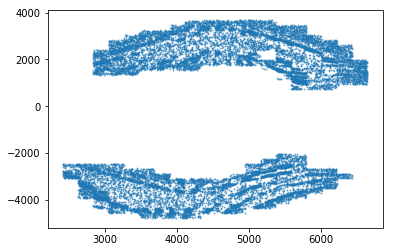

In [181]:
cameradirection = [1,1]
pixelsize = 0.109
X = []
Y = []
for pos in tqdm.tqdm(cell_postions_df['pos'].unique()):
    coordX,coordY = md.image_table[md.image_table.Position==pos].XY.iloc[0]
    pos_temp = cell_postions_df[cell_postions_df.pos==pos]
    for cell in pos_temp.index:
        x = cell_postions_df['x'].loc[cell]*pixelsize*cameradirection[0]+coordX
        y = cell_postions_df['y'].loc[cell]*pixelsize*cameradirection[1]+coordY
        X.append(x)
        Y.append(y)
cell_postions_df['stage_x'] = X
cell_postions_df['stage_y'] = Y
plt.scatter(cell_postions_df['stage_x'],cell_postions_df['stage_y'],s=1,alpha=0.5)
plt.show()

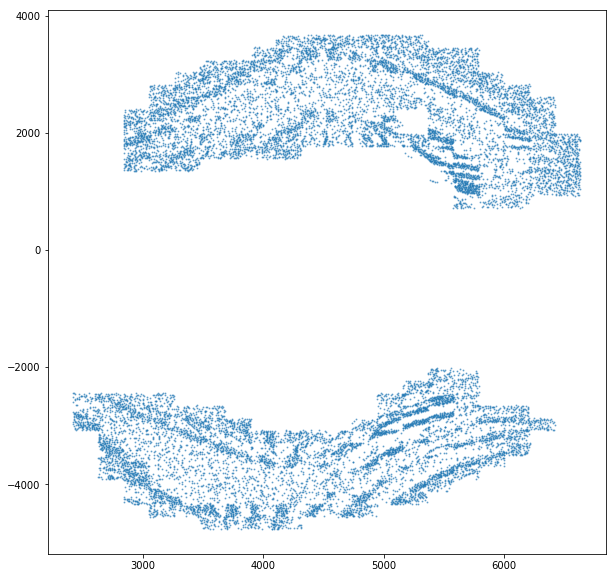

In [182]:
plt.figure(figsize=[10,10])
plt.scatter(cell_postions_df['stage_x'],cell_postions_df['stage_y'],s=1,alpha=0.5)
plt.show()

In [ ]:
# Assign Spots with distance cutoff

In [ ]:
spots = 

In [149]:
np.percentile(b.ravel(),50)

/home/zach/miniconda3/envs/pyspots/lib/python3.6/site-packages/numpy/lib/function_base.py:3826: RuntimeWarning: Invalid value encountered in percentile
  interpolation=interpolation)


nan

In [147]:
b = list(bkg_sub.ravel())
d = img_dilation.ravel()
b[list(np.where(d!=1))]
# b[img_dilation.ravel()!=1]

TypeError: list indices must be integers or slices, not list

In [141]:
val = filters.threshold_otsu(b)

ValueError: autodetected range of [nan, nan] is not finite

In [136]:
img_dilation.max()

1.0

In [ ]:
plt.hist(bkg_sub.ravel(),bins=1000)
plt.show()

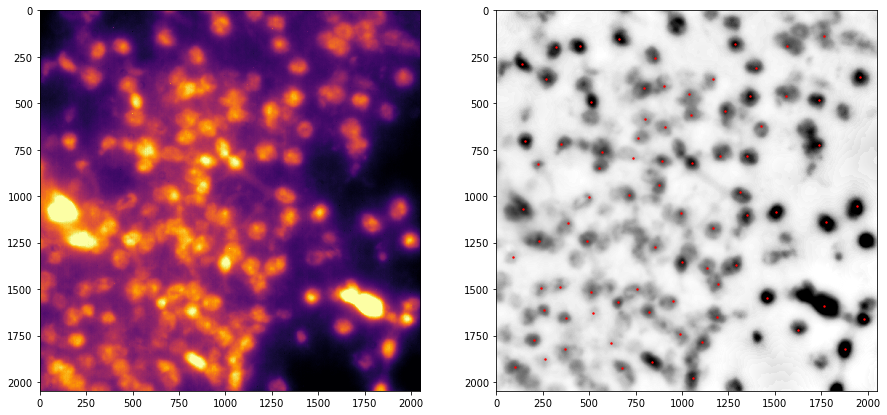

In [122]:
val = np.sqrt(2*((5/0.109)**2))
local_maxi = peak_local_max(bkg_sub, indices=True, min_distance=int(val),labels=img_dilation)
plt.figure(figsize=[15,15])
plt.title(pos)
plt.subplot(1,2,1)
plt.imshow(adjust(img),cmap='inferno')
plt.subplot(1,2,2)
plt.imshow(adjust(bkg_sub),cmap='Greys')
plt.scatter(local_maxi[:,1],local_maxi[:,0],s=2,c='r')
# plt.subplot(1,3,3)
# plt.imshow(img_dilation,cmap='inferno')
plt.show()

In [110]:
local_maxi.shape

(9716, 2)

opening img_Pos1_000000032_000000000_DeepBlue_000_032.tif

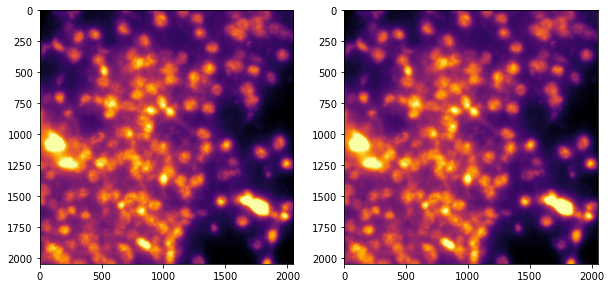

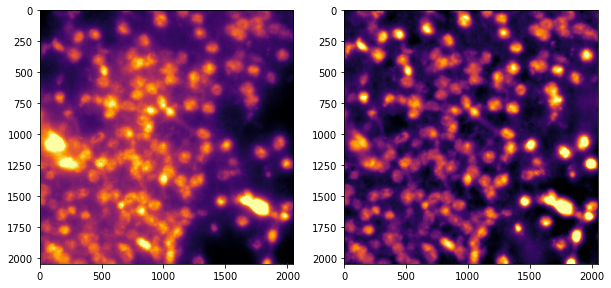

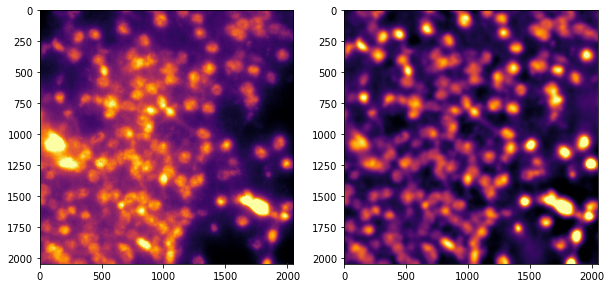

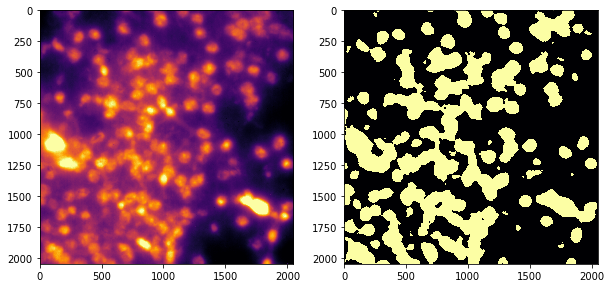

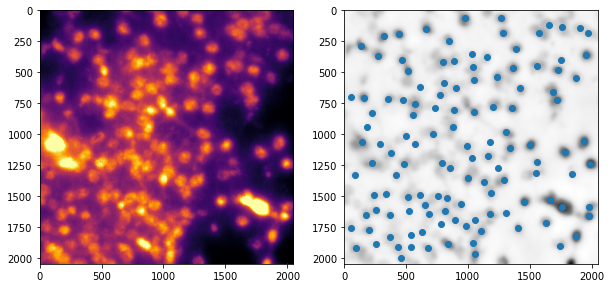

In [28]:
pos = 'Pos1'
stk = md.stkread(Position=pos,Channel='DeepBlue',acq= [i for i in md.acqnames if 'nucstain' in i]).astype('float64')
img = np.sum(stk,axis=2)
blurred = filters.gaussian(img,2)
show(img,blurred)
bkg = filters.gaussian(blurred,100)
bkg_sub = blurred/bkg
show(img,bkg_sub)
blurred2 = filters.gaussian(bkg_sub,10)
show(img,blurred2)
thresh = np.percentile(bkg_sub.ravel(),60)
bkg2 = filters.threshold_local(blurred,301)
bkg_sub2 = blurred/bkg
mask = bkg_sub2>thresh
mask[img<np.percentile(img.ravel(),50)]=False
show(img,mask)
val = np.sqrt(2*((3/0.109)**2))
peaks = blurred2#np.log10(blurred2)
local_maxi = peak_local_max(peaks, indices=True, min_distance=int(val),labels=mask)
plt.figure(figsize=[10,10])
plt.title(pos)
plt.subplot(1,2,1)
plt.imshow(adjust(img),cmap='inferno')
plt.subplot(1,2,2)
plt.imshow(peaks,cmap='Greys')
plt.scatter(local_maxi[:,1],local_maxi[:,0])
plt.show()

opening img_Pos3_000000032_000000000_DeepBlue_000_032.tif

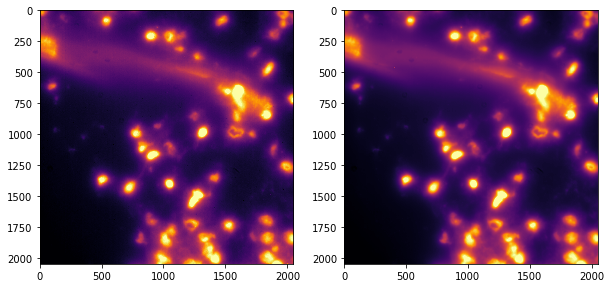

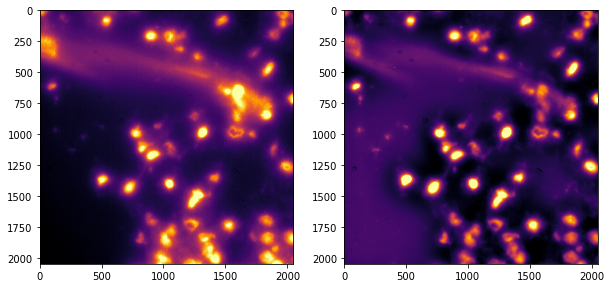

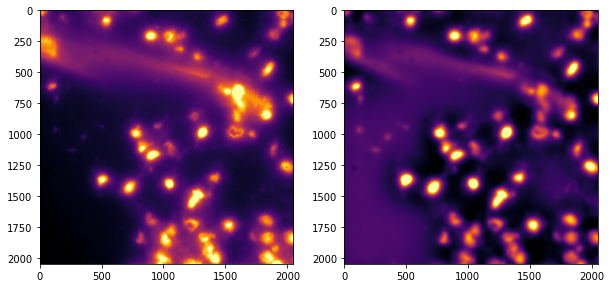

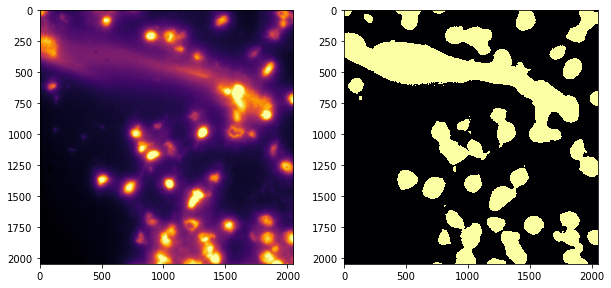

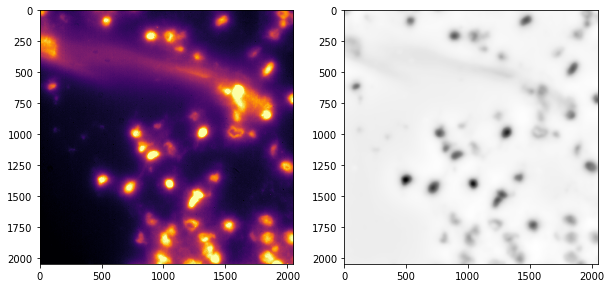

In [34]:
pos = 'Pos3'
stk = md.stkread(Position=pos,Channel='DeepBlue',acq= [i for i in md.acqnames if 'nucstain' in i]).astype('float64')
img = np.sum(stk,axis=2)
blurred = filters.gaussian(img,2)
show(img,blurred)
bkg = filters.gaussian(blurred,100)
bkg_sub = blurred/bkg
show(img,bkg_sub)
blurred2 = filters.gaussian(bkg_sub,10)
show(img,blurred2)
thresh = np.percentile(bkg_sub.ravel(),60)
bkg2 = filters.threshold_local(blurred,301)
bkg_sub2 = blurred/bkg
mask = bkg_sub2>thresh
mask[img<np.percentile(img.ravel(),50)]=False
show(img,mask)
val = np.sqrt(2*((3/0.109)**2))
peaks = blurred2#np.log10(blurred2)
# peaks[mask==False] = 0
local_maxi = peak_local_max(peaks, indices=True, min_distance=int(val),labels=mask)
X = []
Y = []
for i in range(local_maxi.shape[1]):
    x,y = local_maxi[i,:]
    if mask[x,y]:
        X.append(x)
        Y.append(y)
plt.figure(figsize=[10,10])
plt.title(pos)
plt.subplot(1,2,1)
plt.imshow(adjust(img),cmap='inferno')
plt.subplot(1,2,2)
plt.imshow(peaks,cmap='Greys')
plt.scatter(X,Y)
plt.show()